In [157]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.manifold import TSNE
import umap.umap_ as umap
import trimap
import pacmap
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [158]:
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")

print("Train shape:", train.shape)
print("Test shape:", test.shape)
train.head()

Train shape: (2000, 21)
Test shape: (1000, 21)


,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [159]:
print(train.columns)

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')


In [160]:
target_col = 'price_range'

X = train.drop(columns=[target_col])
y = train[target_col]

In [161]:
scaler = RobustScaler()
X_scaled = scaler.fit_transform(X)

In [162]:
X_train, X_val, y_train, y_val = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

In [163]:
def evaluate_model(model, X_train, X_val, y_train, y_val):
    y_pred_train = model.predict(X_train)
    y_pred_val = model.predict(X_val)
    print("Train Accuracy:", accuracy_score(y_train, y_pred_train))
    print("Test Accuracy:", accuracy_score(y_val, y_pred_val))
    print("Precision:", precision_score(y_val, y_pred_val, average='weighted'))
    print("Recall:", recall_score(y_val, y_pred_val, average='weighted'))
    print("F1:", f1_score(y_val, y_pred_val, average='weighted'))

In [164]:
def visualize_embeddings(
    X, y, model, title_prefix="",
):
    """
    Визуализация данных с помощью t-SNE, UMAP, TriMAP и PaCMAP
    при различных параметрах.
    Левая колонка — истинные классы, правая — предсказания модели.
    """
    y_pred = model.predict(X)

    tsne_params = [
        {"perplexity": 30, "learning_rate": 200},
        {"perplexity": 10, "learning_rate": 500},
    ]
    umap_params = [
        {"n_neighbors": 15, "min_dist": 0.1},
        {"n_neighbors": 50, "min_dist": 0.5},
    ]
    trimap_params = [
        {"n_inliers": 10, "n_outliers": 5},
        {"n_inliers": 20, "n_outliers": 10},
    ]
    pacmap_params = [
        {"n_neighbors": 10},
        {"n_neighbors": 50},
    ]

    embedding_methods = {
        "t-SNE": (TSNE, tsne_params),
        "UMAP": (umap.UMAP, umap_params),
        "TriMAP": (trimap.TRIMAP, trimap_params),
        "PaCMAP": (pacmap.PaCMAP, pacmap_params),
    }

    for name, (Algo, param_list) in embedding_methods.items():
        for i, params in enumerate(param_list, 1):
            # 🧩 исправленный вызов TriMAP
            if name == "TriMAP":
                emb = Algo(**params).fit_transform(X)
            else:
                emb = Algo(**params, random_state=42).fit_transform(X)

            fig, ax = plt.subplots(1, 2, figsize=(13, 6))
            fig.suptitle(f"{title_prefix} {name} (вариант {i})", fontsize=14)

            # --- Истинные классы ---
            sns.scatterplot(
                x=emb[:, 0], y=emb[:, 1],
                hue=y, style=y, palette="tab10", s=40, edgecolor="none", ax=ax[0]
            )
            ax[0].set_title("Истинные метки классов")
            ax[0].set_xlabel("dim1"); ax[0].set_ylabel("dim2")

            # --- Предсказанные классы ---
            sns.scatterplot(
                x=emb[:, 0], y=emb[:, 1],
                hue=y_pred, style=y_pred, palette="tab10", s=40, edgecolor="none", ax=ax[1]
            )
            ax[1].set_title("Предсказания модели")
            ax[1].set_xlabel("dim1"); ax[1].set_ylabel("dim2")

            plt.tight_layout()
            plt.show()

Best SVM params: {'C': 10, 'gamma': 'scale', 'kernel': 'linear'}
Train Accuracy: 0.98125
Test Accuracy: 0.9625
Precision: 0.9646927819968661
Recall: 0.9625
F1: 0.9626050321054475


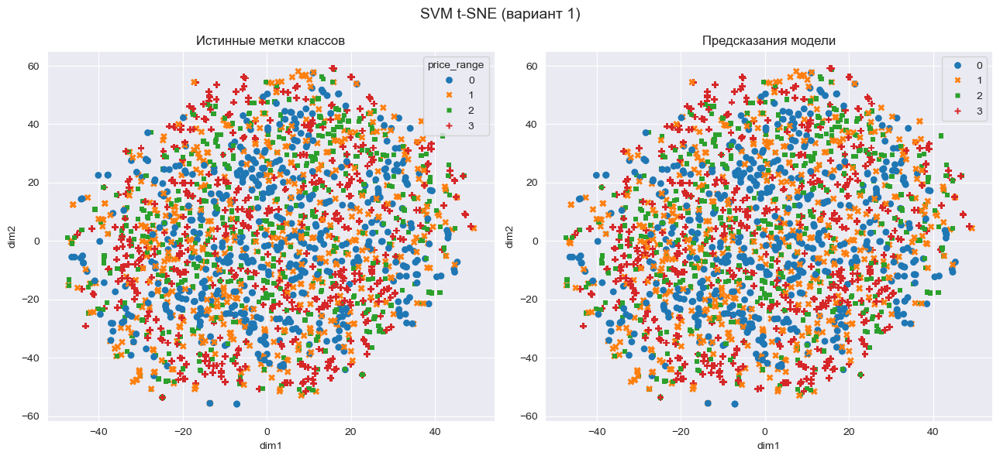

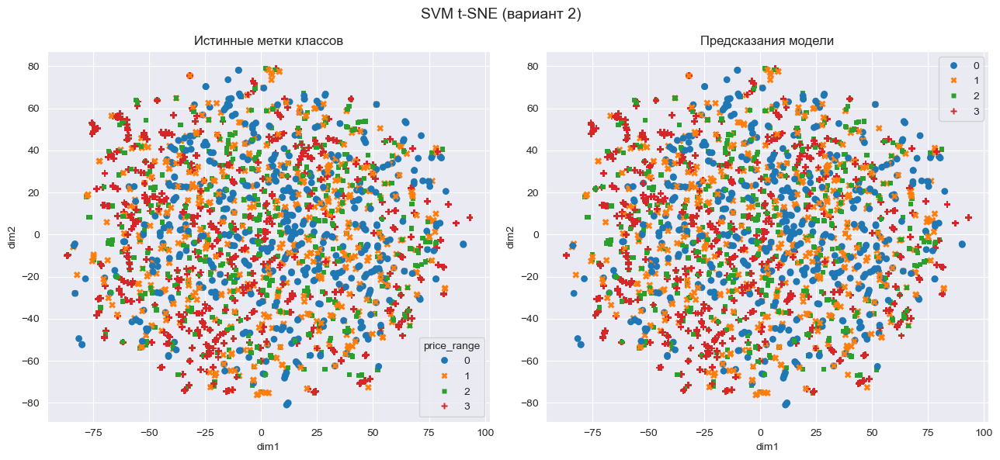

C:\Users\ursus\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



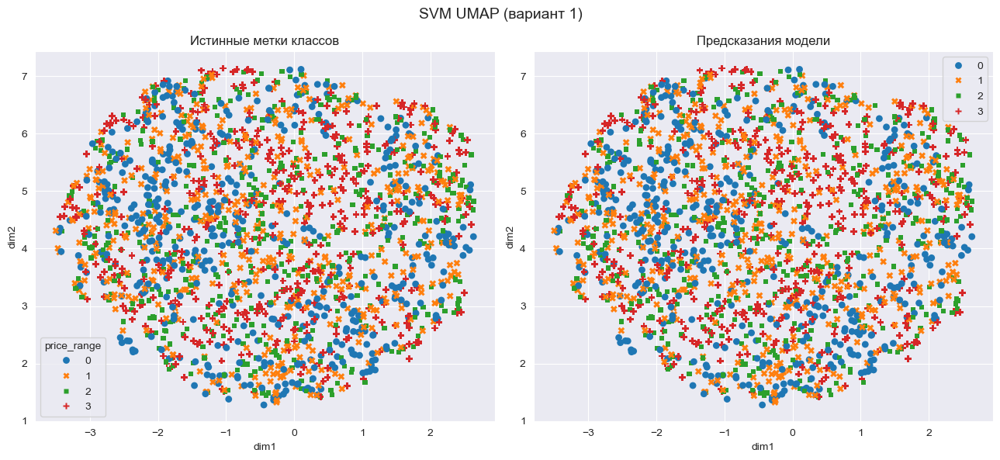

C:\Users\ursus\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



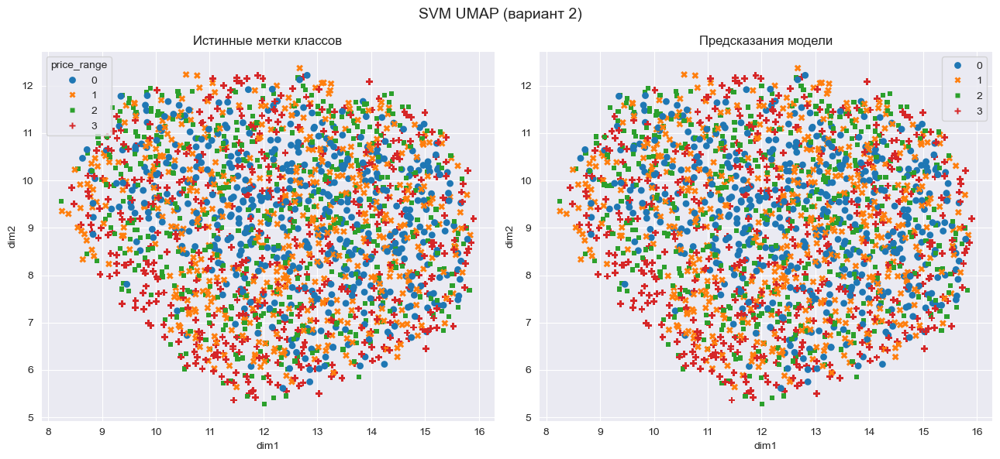

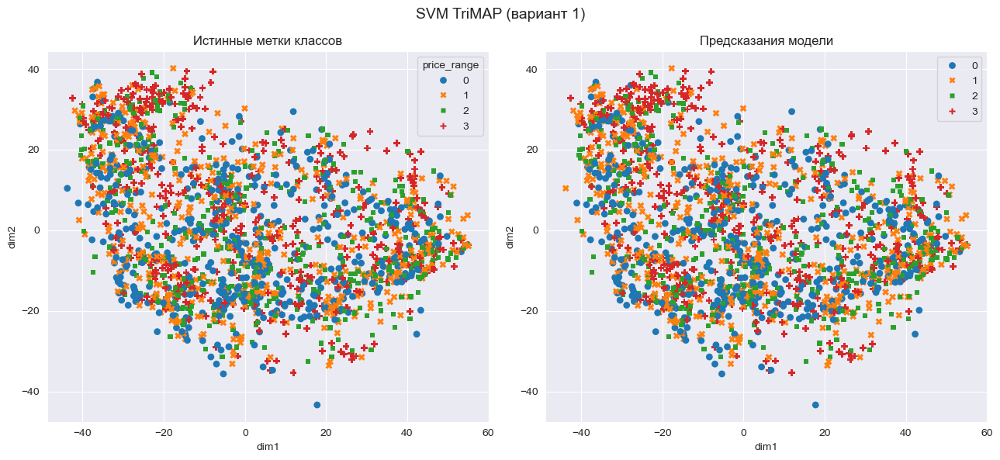

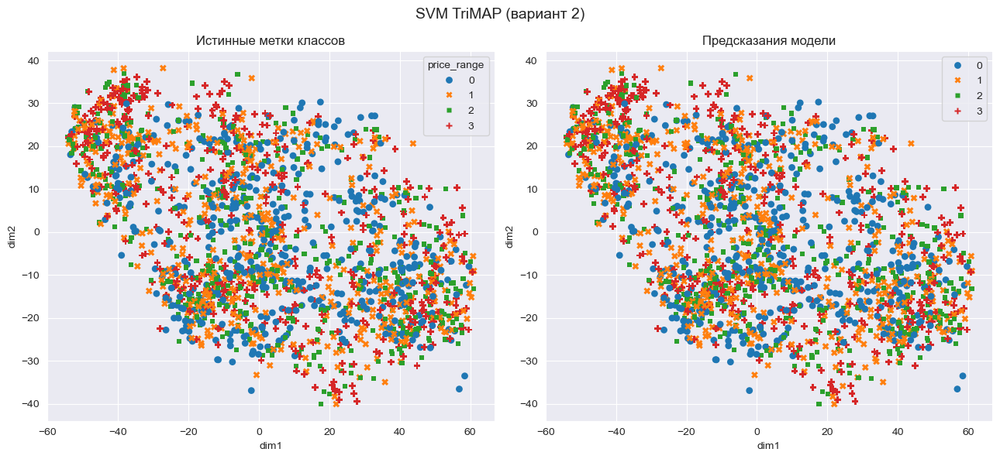

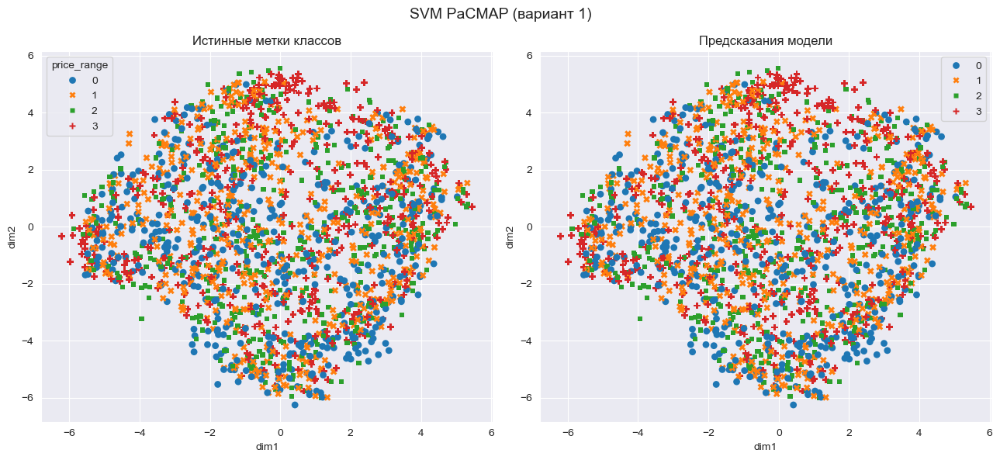

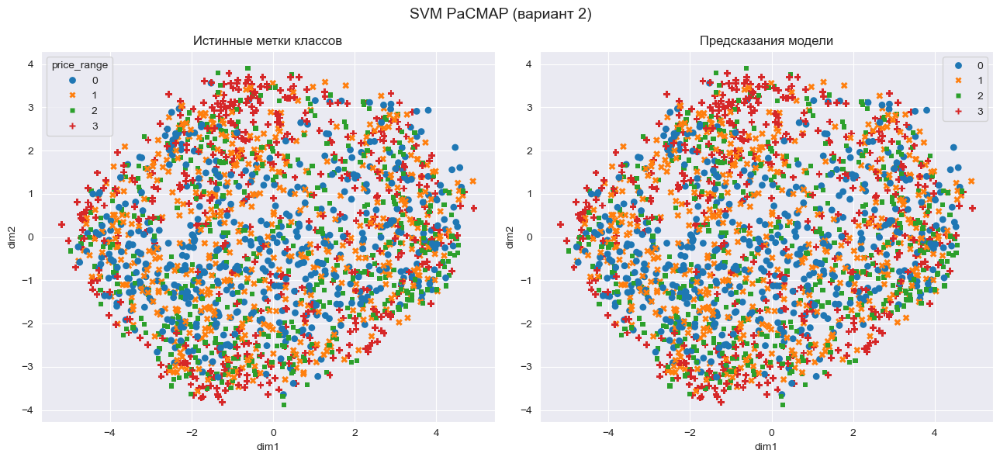

In [165]:
svm_params = {
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
    'C': [0.1, 1, 10],
    'gamma': ['scale', 'auto']
}

svm = GridSearchCV(SVC(), svm_params, cv=5, scoring='accuracy', n_jobs=-1)
svm.fit(X_train, y_train)

print("Best SVM params:", svm.best_params_)
evaluate_model(svm.best_estimator_, X_train, X_val, y_train, y_val)
visualize_embeddings(X_scaled, y, svm.best_estimator_, "SVM")

Best kNN params: {'metric': 'manhattan', 'n_neighbors': 7, 'weights': 'distance'}
Train Accuracy: 1.0
Test Accuracy: 0.5825
Precision: 0.5996635017287191
Recall: 0.5825
F1: 0.5892014098725524


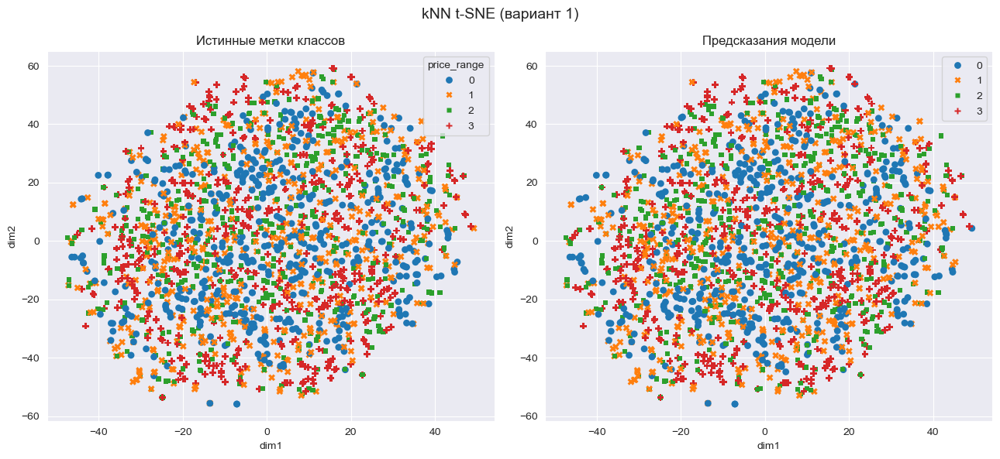

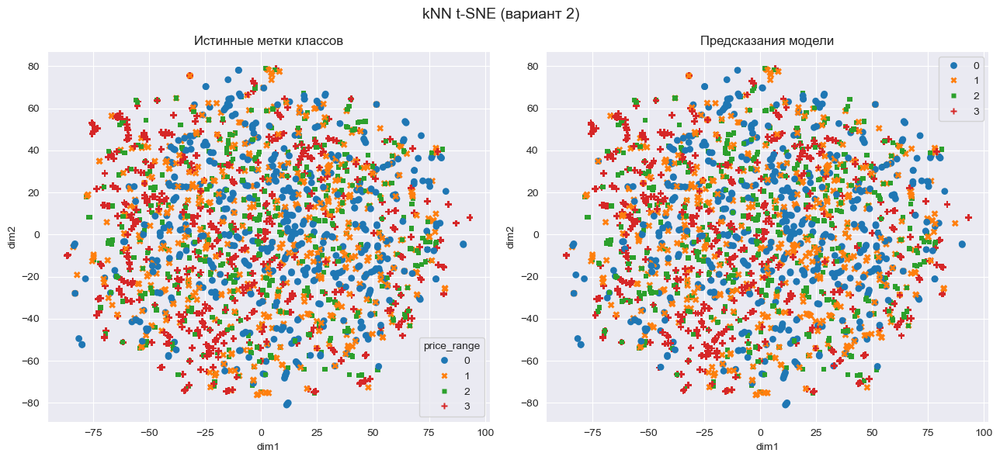

C:\Users\ursus\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



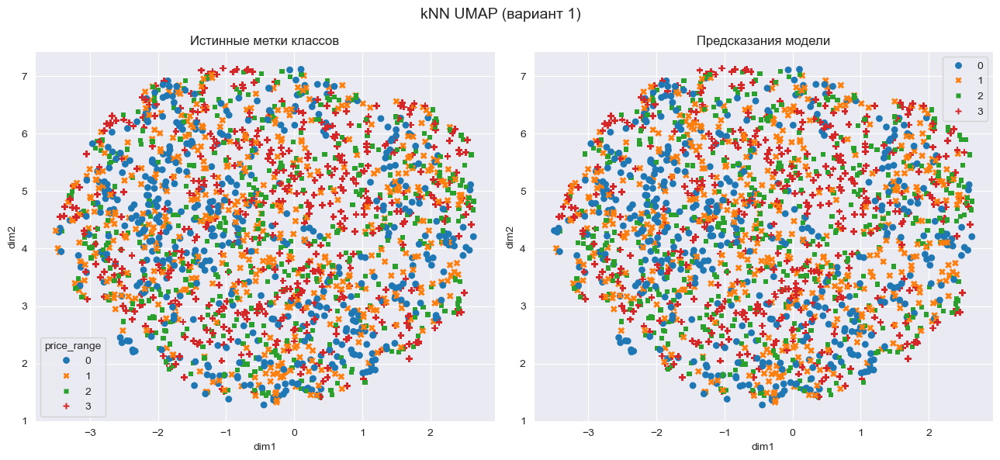

C:\Users\ursus\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



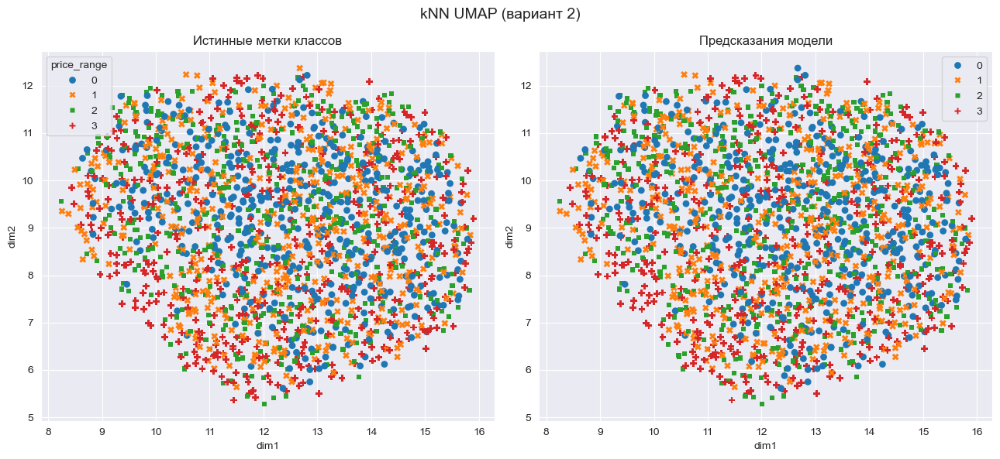

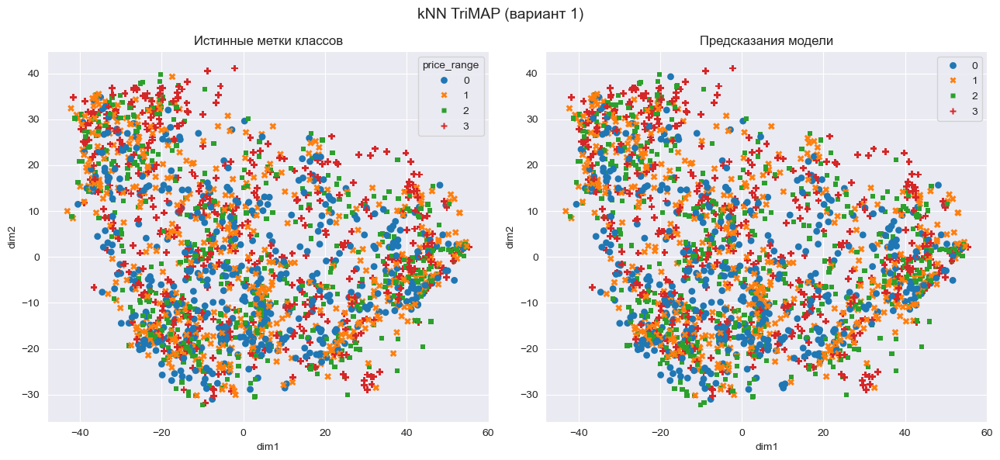

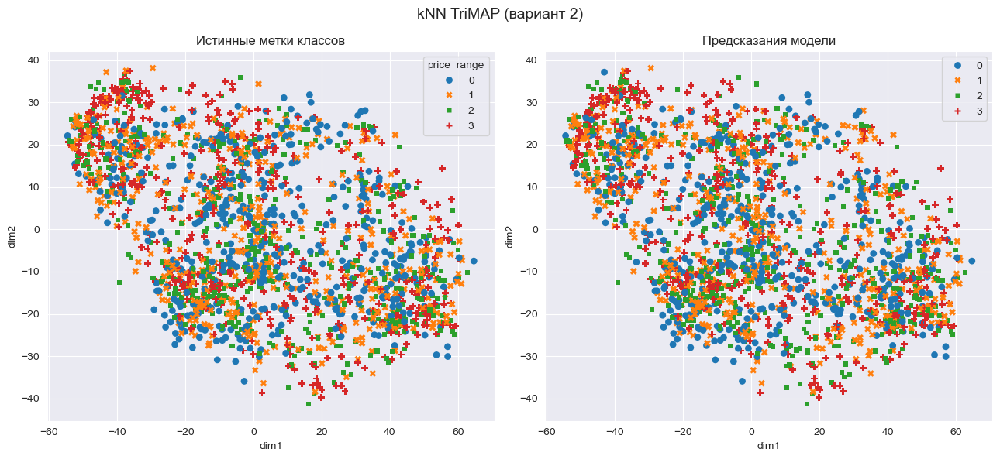

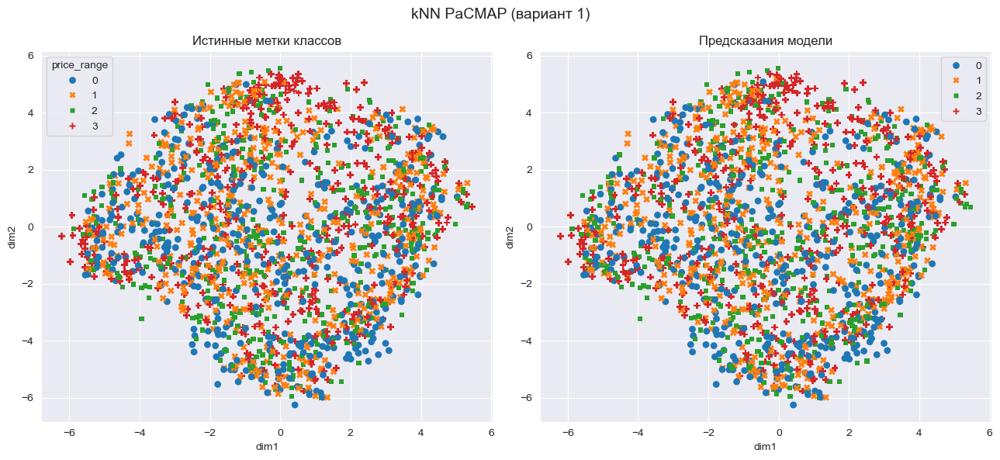

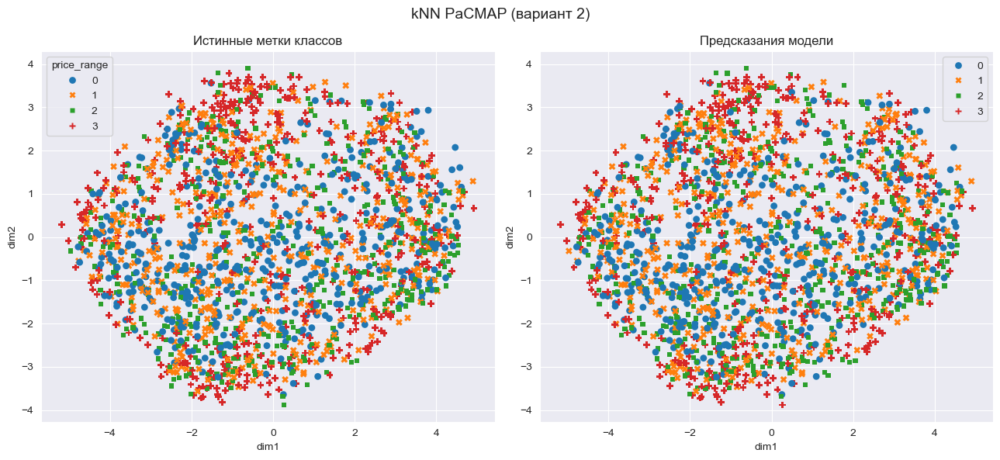

In [166]:
knn_params = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

knn = GridSearchCV(KNeighborsClassifier(), knn_params, cv=5, scoring='accuracy', n_jobs=-1)
knn.fit(X_train, y_train)

print("Best kNN params:", knn.best_params_)
evaluate_model(knn.best_estimator_, X_train, X_val, y_train, y_val)
visualize_embeddings(X_scaled, y, knn.best_estimator_, "kNN")

Best RF params: {'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 200}
Train Accuracy: 1.0
Test Accuracy: 0.8875
Precision: 0.8893252440796531
Recall: 0.8875
F1: 0.8877213121804104


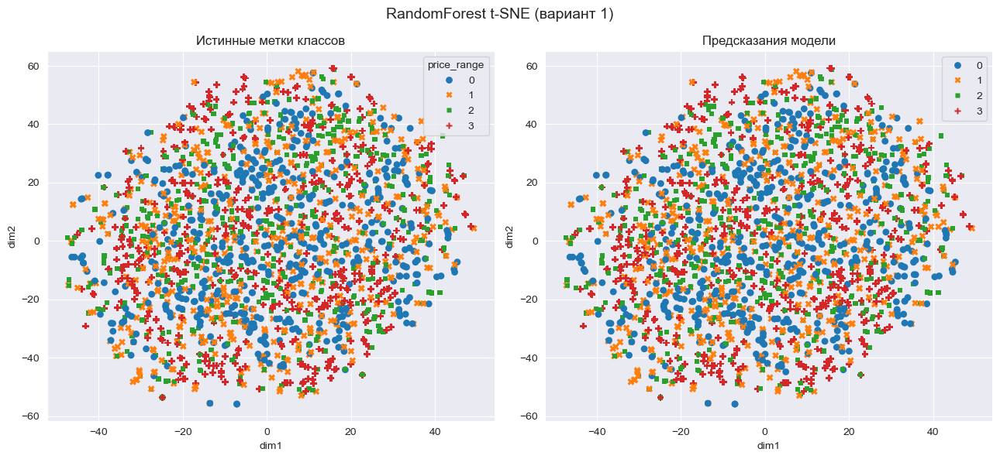

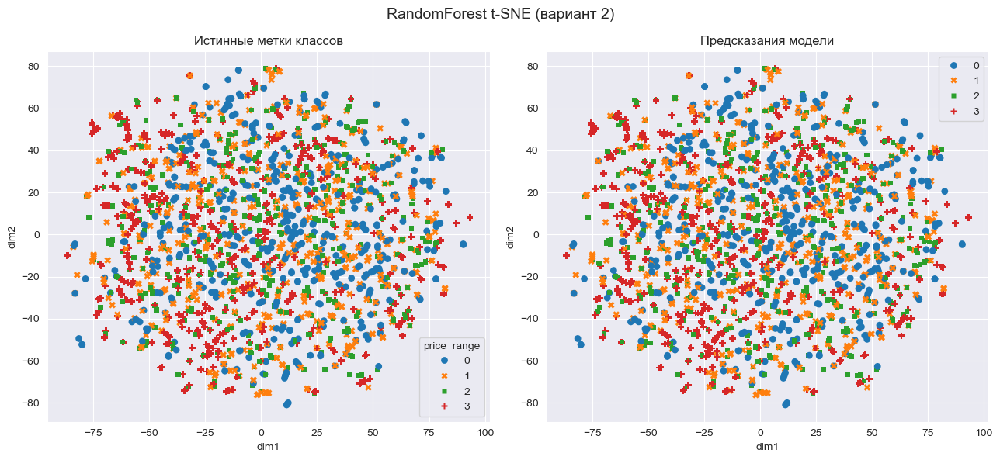

C:\Users\ursus\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



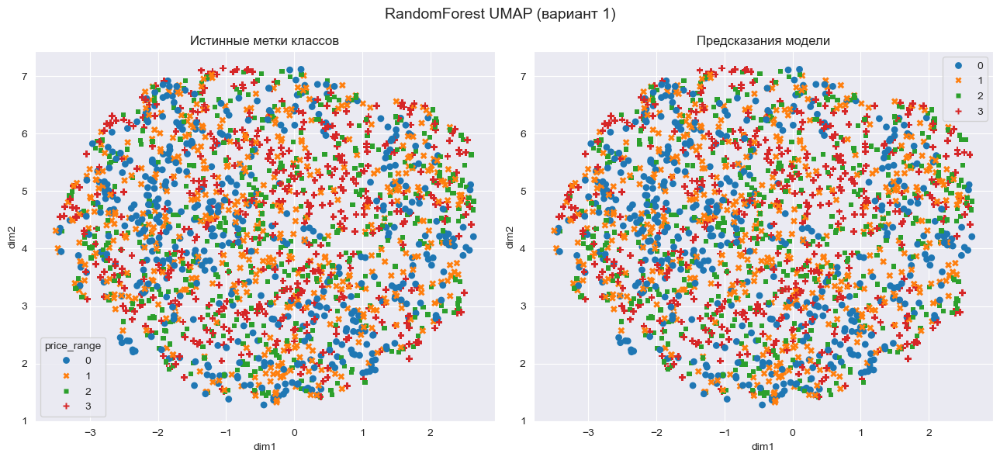

C:\Users\ursus\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



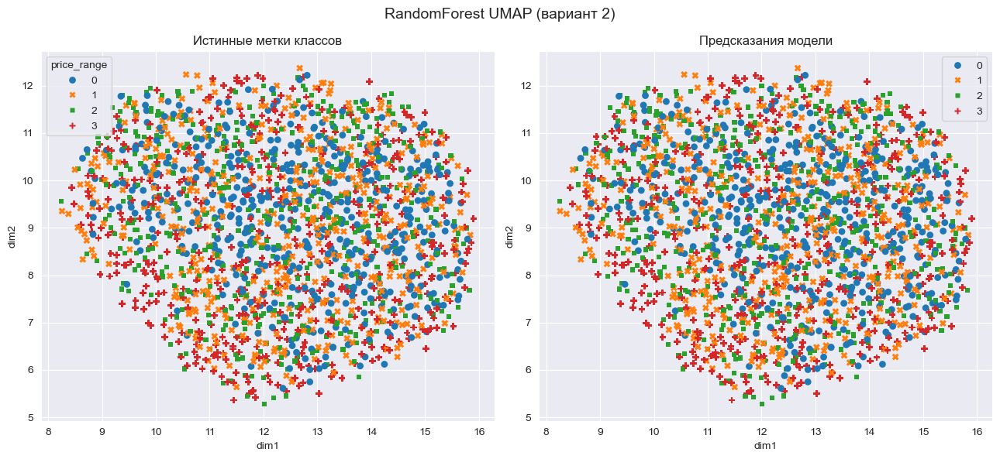

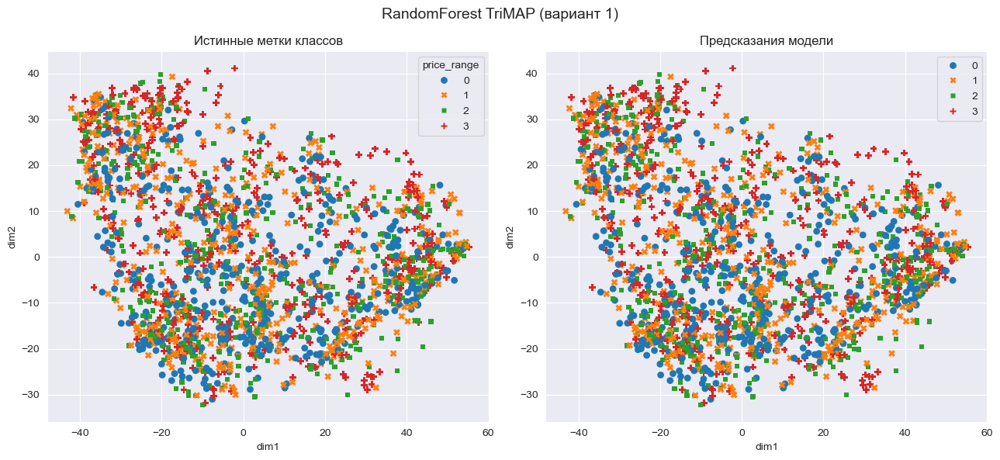

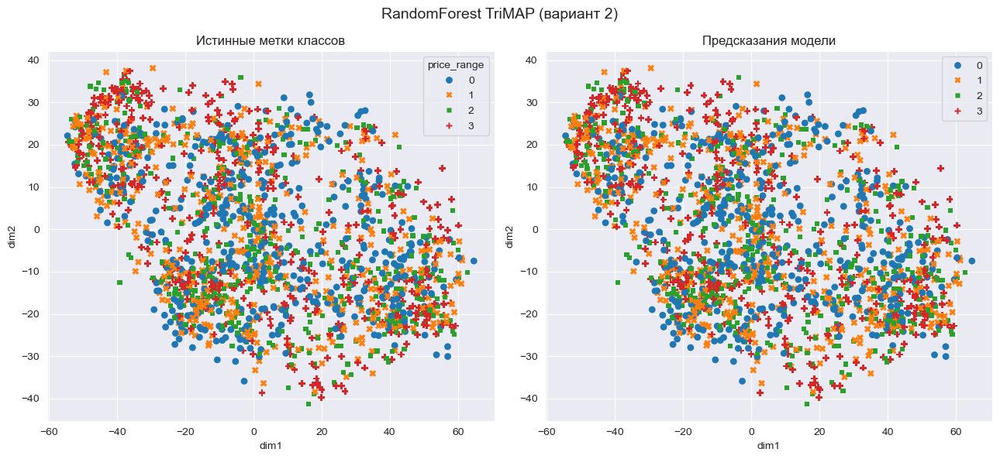

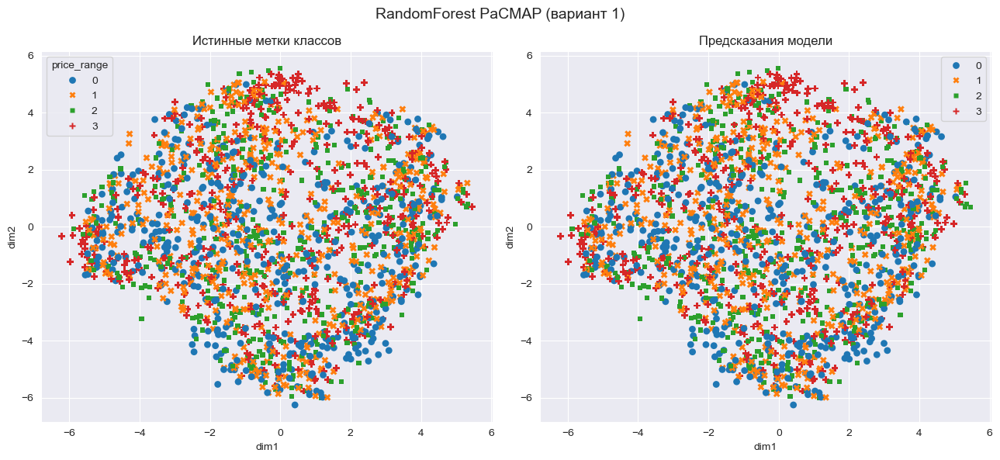

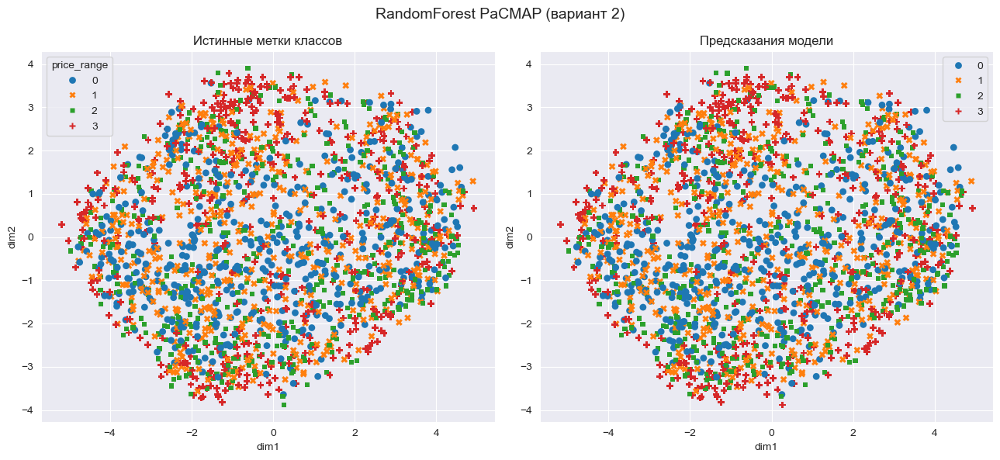

In [167]:
rf_params = {
    'n_estimators': [50, 100, 200],
    'max_depth': [5, 10, 15, 20],
    'min_samples_split': [2, 5, 10]
}

rf = GridSearchCV(RandomForestClassifier(random_state=42), rf_params, cv=5, scoring='accuracy', n_jobs=-1)
rf.fit(X_train, y_train)

print("Best RF params:", rf.best_params_)
evaluate_model(rf.best_estimator_, X_train, X_val, y_train, y_val)
visualize_embeddings(X_scaled, y, rf.best_estimator_, "RandomForest")